In [86]:
import random
import numpy as np
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [87]:
business_ids = []
names = []
categories = []
tips = []
reviews = []
with open('merge_test.json', encoding='utf-8') as f:
        records = f.readlines()
        for record in records:
            data = json.loads(record)
            business_ids.append(data['business_id'])
            names.append(data['name'])
            categories.append(data['categories'])
            tips.append(data['tip'])
            reviews.append(data['review'])

In [88]:
def sampling(records, num=10000):
    return records[:num]


business_ids_sample = sampling(business_ids)
names_sample = sampling(names)
categories_sample = sampling(categories)
tips_sample = sampling(tips)
reviews_sample = sampling(reviews)

# using nltk for preprocessing and generating corpus

In [92]:
import nltk
from nltk.text import TextCollection
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
# nltk.download('stopwords')

In [123]:
def generate_corpus(records):
    
    stop_words = set(stopwords.words('english'))
    # hand writen rules
    stop_words.add("'s")
    stop_words.add('&')
    stop_words.add('-')
    stop_words.add("'")
    stop_words.add("‘")
    stop_words.add(',')
    
    
    filtered_sentences = []
    for record in records:
        word_tokens = word_tokenize(record)
        filtered_sentence = [w.lower() for w in word_tokens if w.lower() not in stop_words]
        filtered_sentences.append(' '.join(filtered_sentence))
#     filtered_sentences_sample = filtered_sentences[:10000]
    
    return filtered_sentences

In [117]:
corpus_names = generate_corpus(names_sample)

In [70]:
# for i in categories_sample:
#     if not isinstance(i,str):
#         print(i)
#         print(type(i))
#         break

In [124]:
for i in range(len(categories_sample)):
    if categories_sample[i] is None:
        categories_sample[i] = ''
corpus_categories = generate_corpus(categories_sample)

In [128]:
corpus_tips = generate_corpus(tips_sample)

In [127]:
corpus_reviews = generate_corpus(reviews_sample)

# computing TF-IDF

   [There are several known issues with ‘english’, the built-in stop word list in sklearn.](https://aclanthology.org/W18-2502/), but we have already done the filtering in nltk, so it won't be a problem.

In [89]:
def computing_tfidf(sample):
    vectorizer = CountVectorizer(stop_words='english')
    tf_idf_transformer = TfidfTransformer()
    tf_idf = tf_idf_transformer.fit_transform(vectorizer.fit_transform(tips_sample))
    term_weight = tf_idf.toarray()
    return term_weight

In [90]:
business_ids_tw = (business_ids_sample)
names_tw = computing_tfidf(names_sample)
categories_tw = computing_tfidf(categories_sample)
tips_tw = computing_tfidf(tips_sample)
reviews_tw = computing_tfidf(reviews_sample)

# draw word cloud with clustering

In [97]:
def plot_word_cloud(result):

    wc = WordCloud(
            background_color='white',
            width=1000,
            height=700,
            max_font_size=500,
            min_font_size=10,
            mode='RGBA'
            #colormap='pink'
            )

    wc.generate(' '.join(result))

    #wc.to_file(r"wordcloud.png") 

    # plt.figure("mywordcloud")
    plt.figure(figsize=(18, 12))
    plt.imshow(wc)
    plt.axis("off")
    plt.show()

In [58]:
def culster_word_cloud(k, term_weight, corpus):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(term_weight)
    labels = list(kmeans.labels_)
    for label in list(set(labels)):
        result = []
        for i in range(len(labels)):
            if labels[i] == label:
                result.append(corpus[i])
        plot_word_cloud(result)  

## names

In [119]:
counter = Counter(' '.join(corpus_names).split())
sorted(counter.items(), key=lambda x:-x[1])

[('pizza', 257),
 ('restaurant', 232),
 ('spa', 219),
 ('center', 217),
 ('bar', 204),
 ('auto', 183),
 ('salon', 182),
 ('nails', 173),
 ('grill', 168),
 ('care', 129),
 (',', 128),
 ('house', 123),
 ('shop', 122),
 ('service', 121),
 ('cafe', 117),
 ('dental', 106),
 ('park', 104),
 ('inn', 97),
 ('store', 96),
 ('hair', 95),
 ('nail', 93),
 ('repair', 91),
 ('market', 89),
 ('services', 83),
 ('family', 80),
 ('car', 80),
 ('new', 78),
 ('hospital', 78),
 ('tampa', 77),
 ('city', 76),
 ('mexican', 74),
 ('studio', 73),
 ('company', 69),
 ('express', 69),
 ('kitchen', 68),
 ('club', 66),
 ('king', 66),
 ('fitness', 63),
 ('pet', 61),
 ('animal', 60),
 ('home', 58),
 ('philadelphia', 57),
 ('sushi', 57),
 ('cleaners', 56),
 ('la', 55),
 ('beauty', 55),
 ('wash', 54),
 ('tire', 53),
 ('mcdonald', 53),
 ('taco', 53),
 ('food', 52),
 ('coffee', 51),
 ('starbucks', 51),
 ('health', 50),
 ('plumbing', 50),
 ('st.', 50),
 ('suites', 50),
 ('massage', 50),
 ('’', 48),
 ('moving', 48),
 ('aut

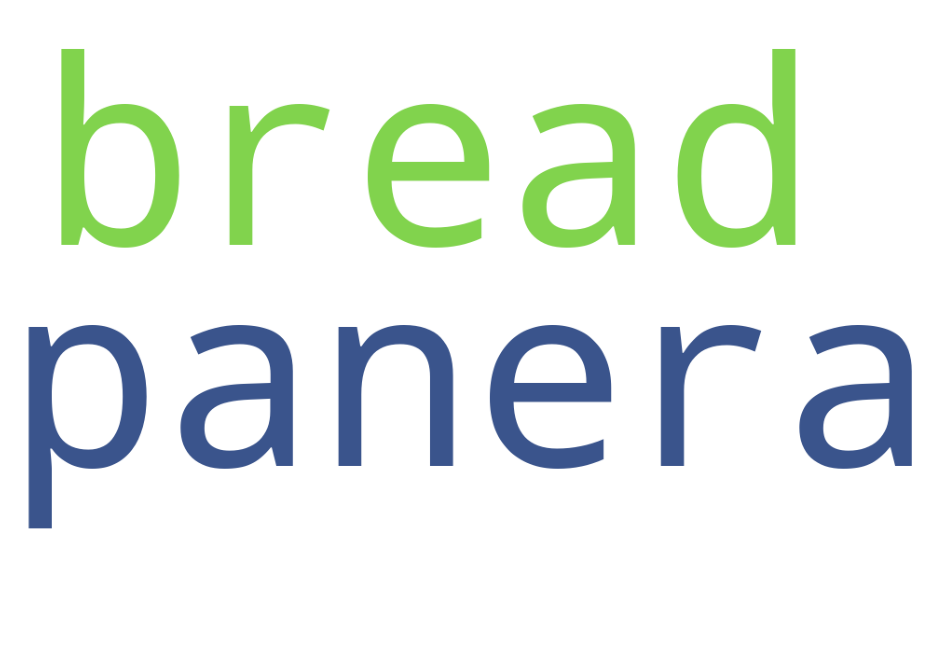

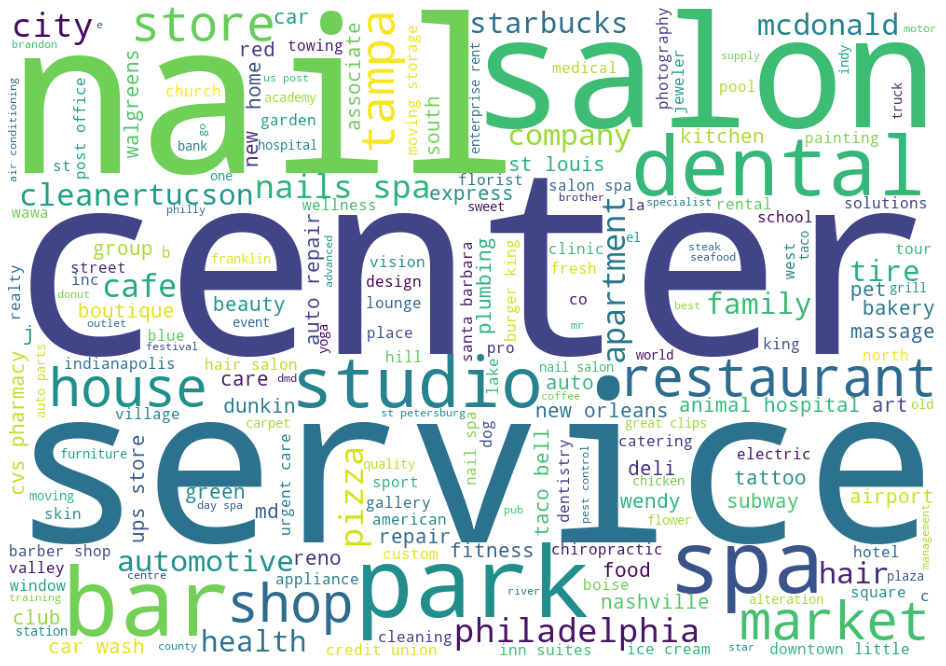

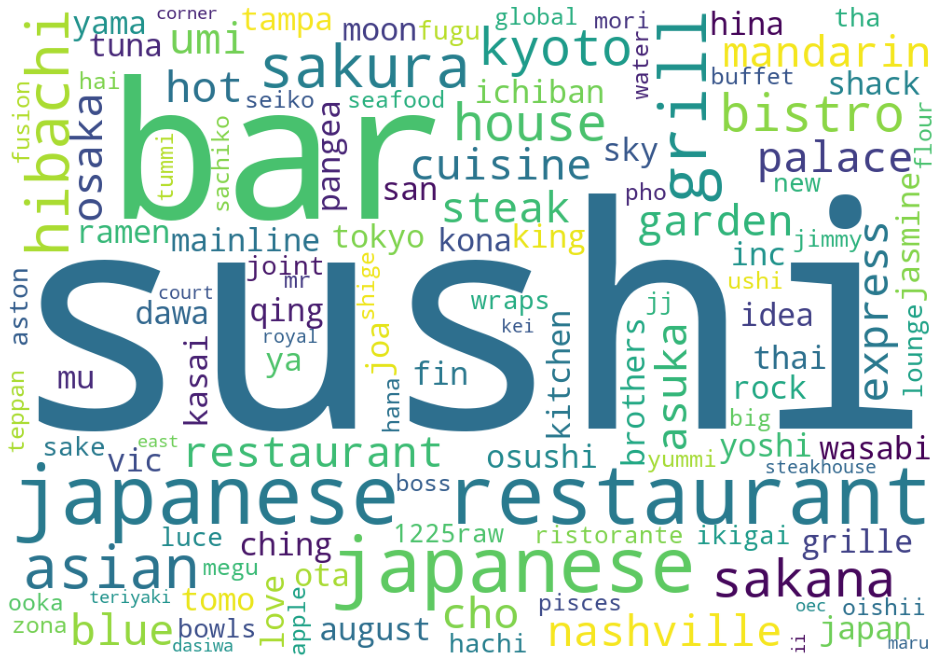

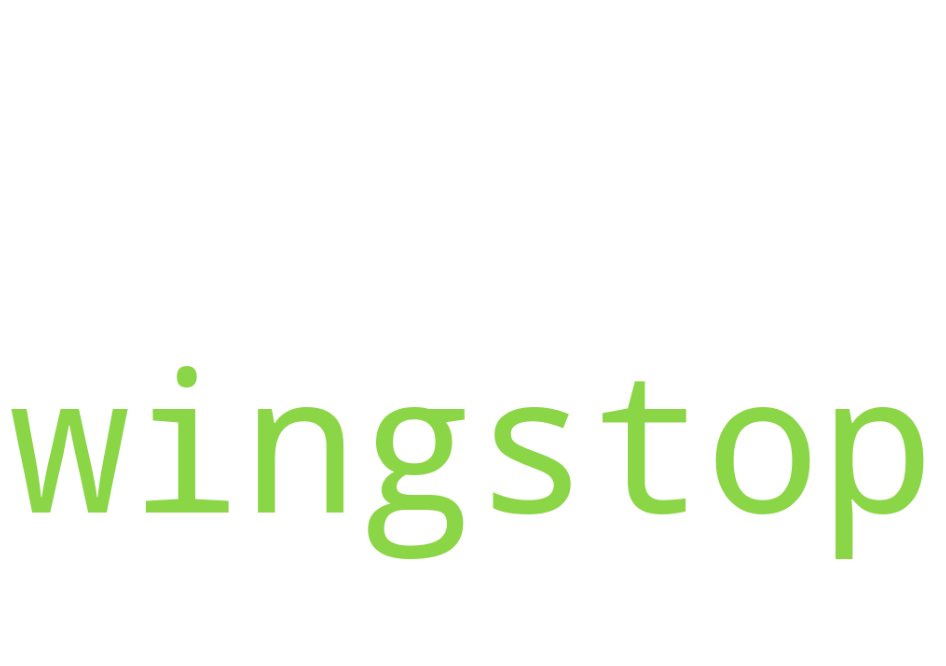

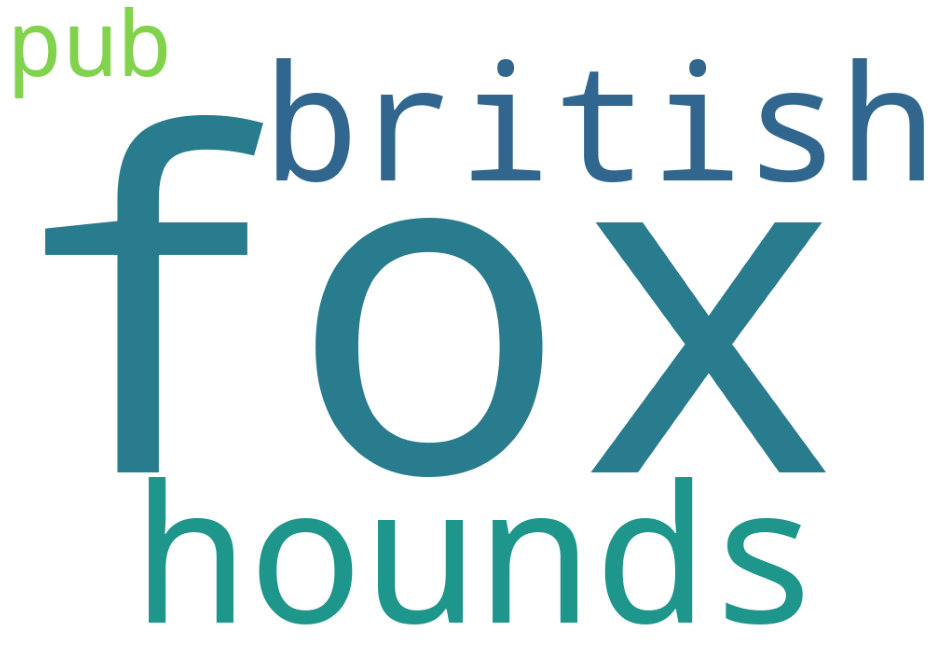

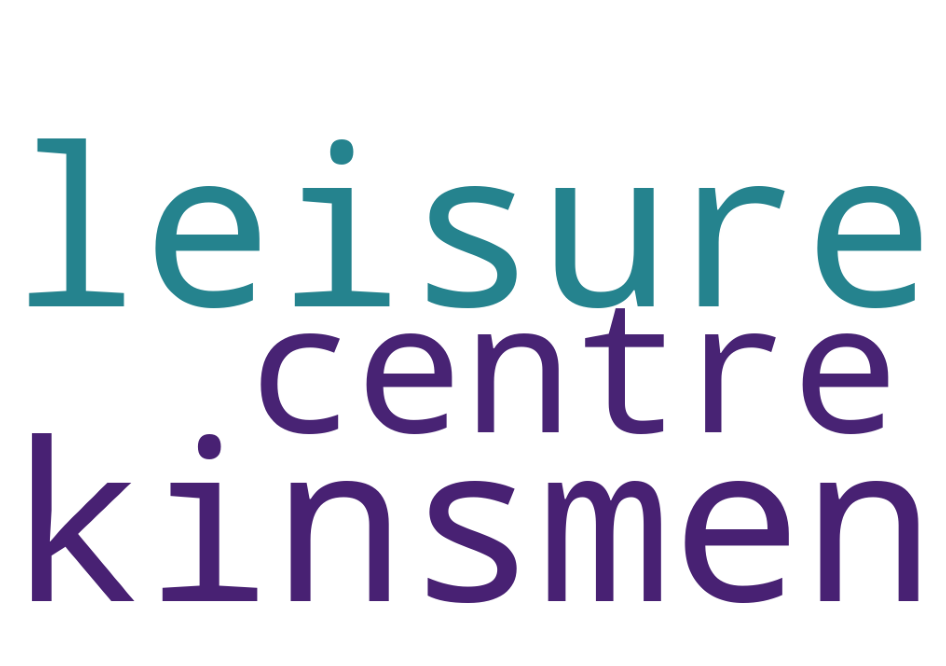

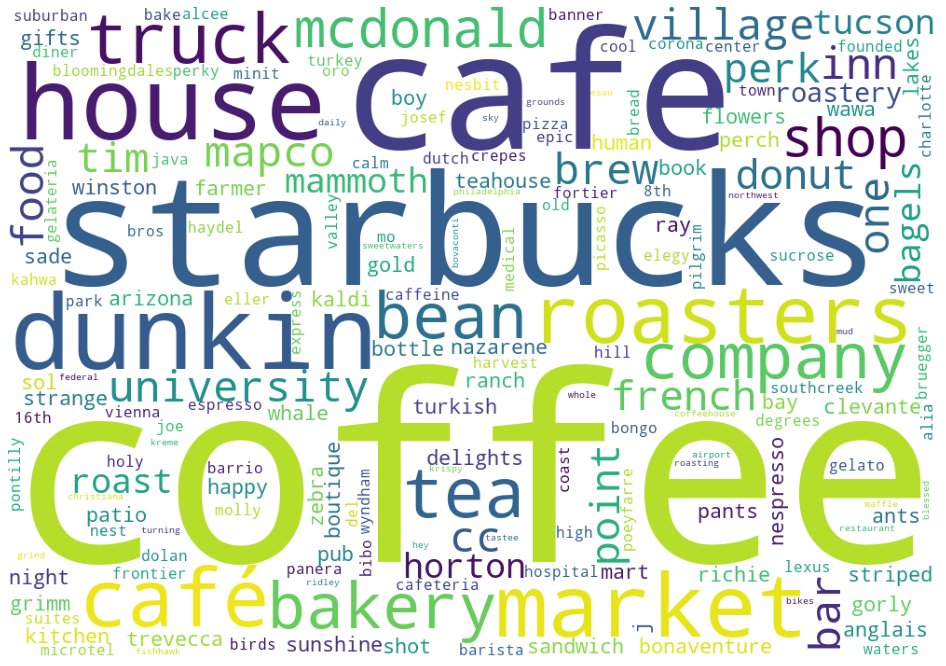

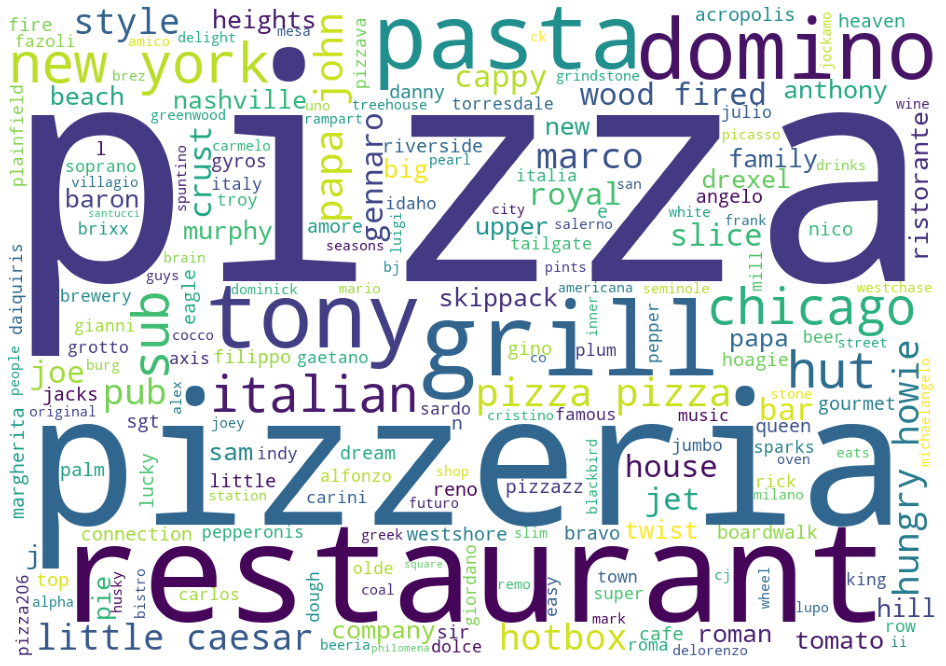

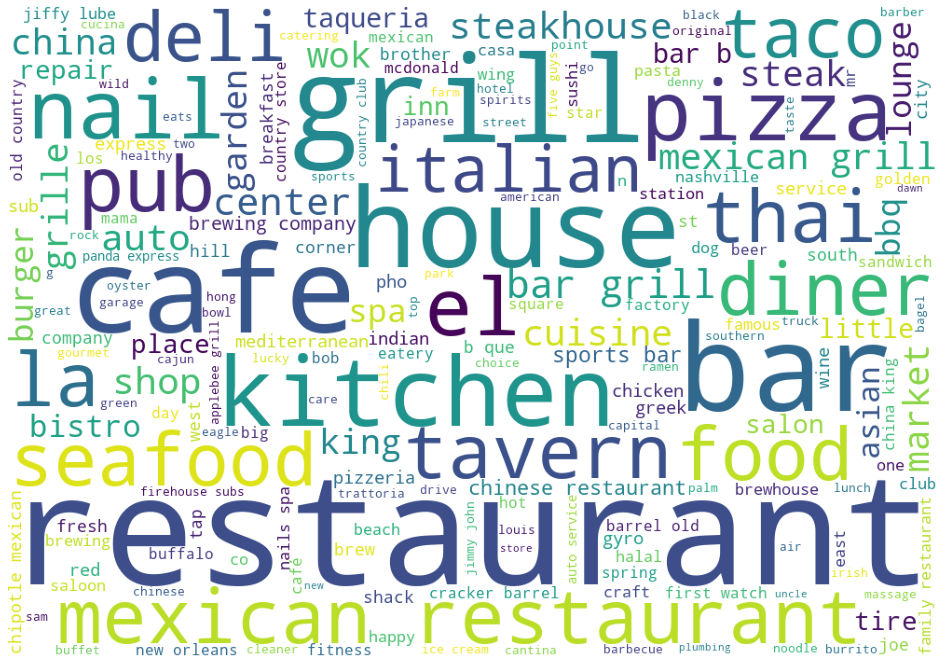

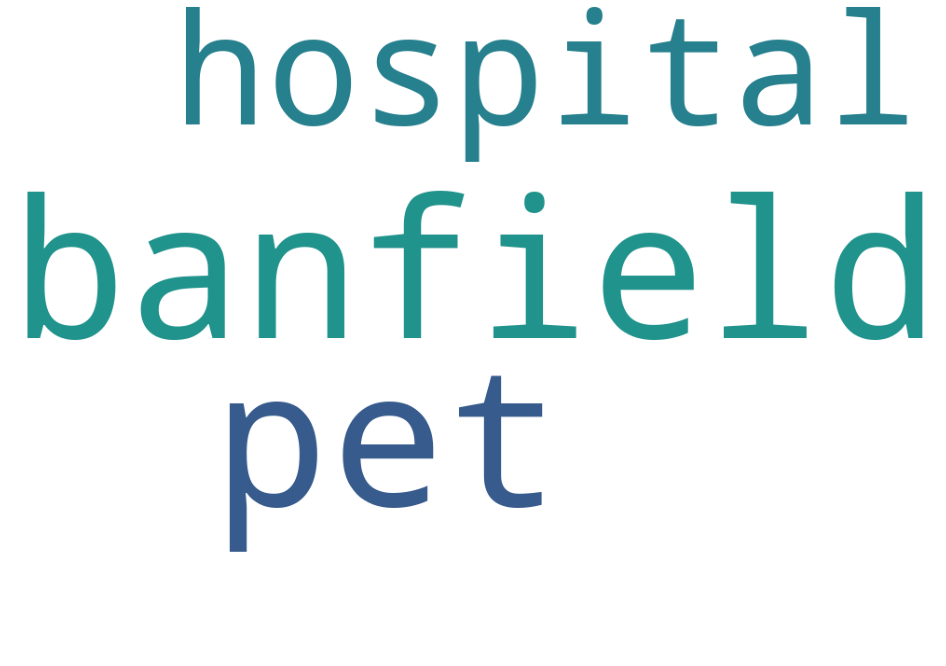

In [120]:
culster_word_cloud(10, names_tw, corpus_names)

## categories

In [125]:
counter = Counter(' '.join(corpus_categories).split())
sorted(counter.items(), key=lambda x:-x[1])

[('services', 4277),
 ('restaurants', 2916),
 ('food', 2693),
 ('home', 1813),
 ('shopping', 1662),
 ('spas', 1281),
 ('bars', 1261),
 ('beauty', 1211),
 ('medical', 1064),
 ('local', 1014),
 ('event', 990),
 ('health', 976),
 ('hair', 887),
 ('planning', 845),
 ('repair', 841),
 ('automotive', 836),
 ('american', 823),
 ('stores', 785),
 ('(', 784),
 (')', 784),
 ('salons', 784),
 ('auto', 722),
 ('nightlife', 706),
 ('hotels', 649),
 ('pet', 586),
 ('life', 568),
 ('active', 550),
 ('arts', 516),
 ('sandwiches', 504),
 ('travel', 471),
 ('traditional', 471),
 ('fast', 452),
 ('tea', 432),
 ('pizza', 413),
 ('coffee', 413),
 ('estate', 413),
 ('real', 403),
 ('garden', 401),
 ('dentists', 393),
 ('breakfast', 392),
 ('entertainment', 391),
 ('nail', 374),
 ('brunch', 372),
 ('fashion', 368),
 ('shops', 367),
 ('car', 351),
 ('removal', 347),
 ('specialty', 338),
 ('new', 336),
 ('supplies', 336),
 ('burgers', 336),
 ('care', 322),
 ('stations', 304),
 ('cleaning', 304),
 ('mexican', 2

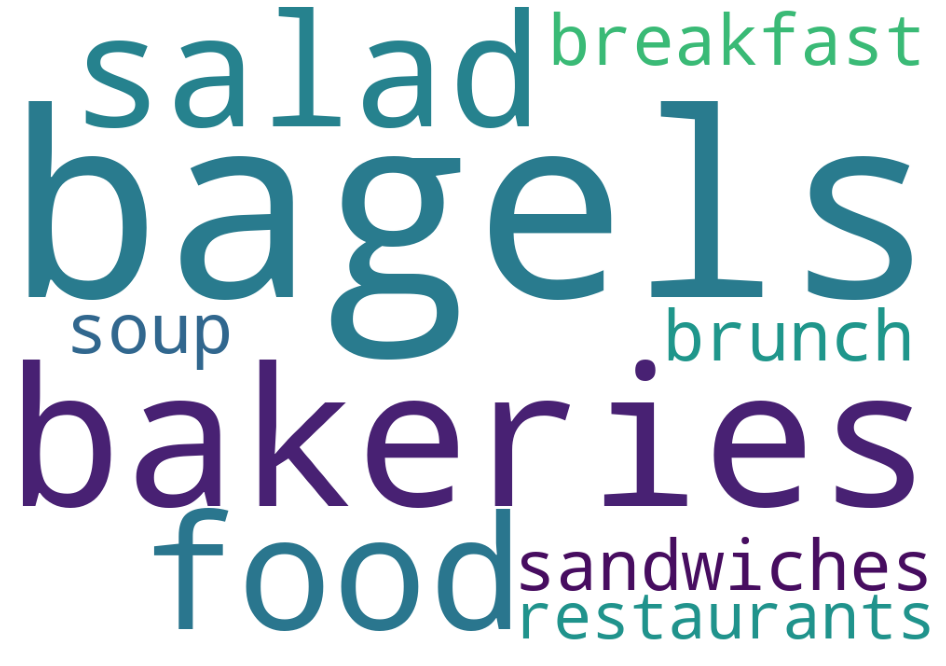

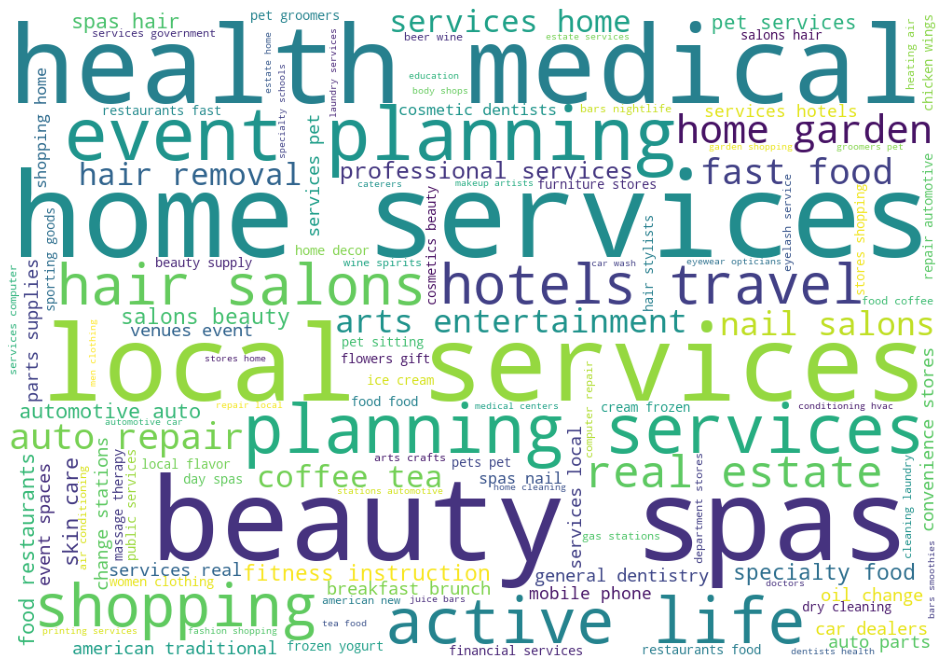

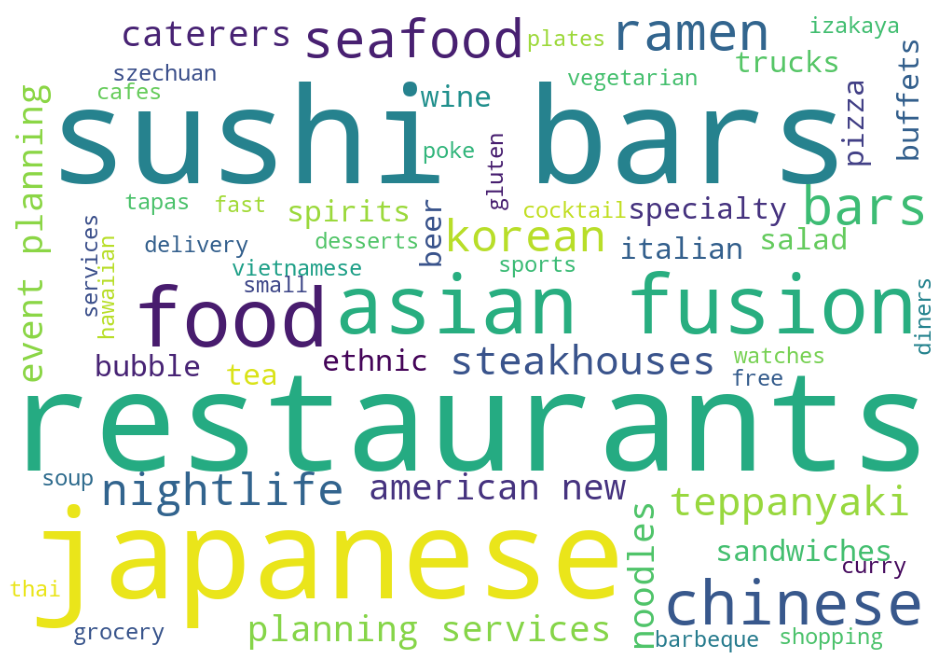

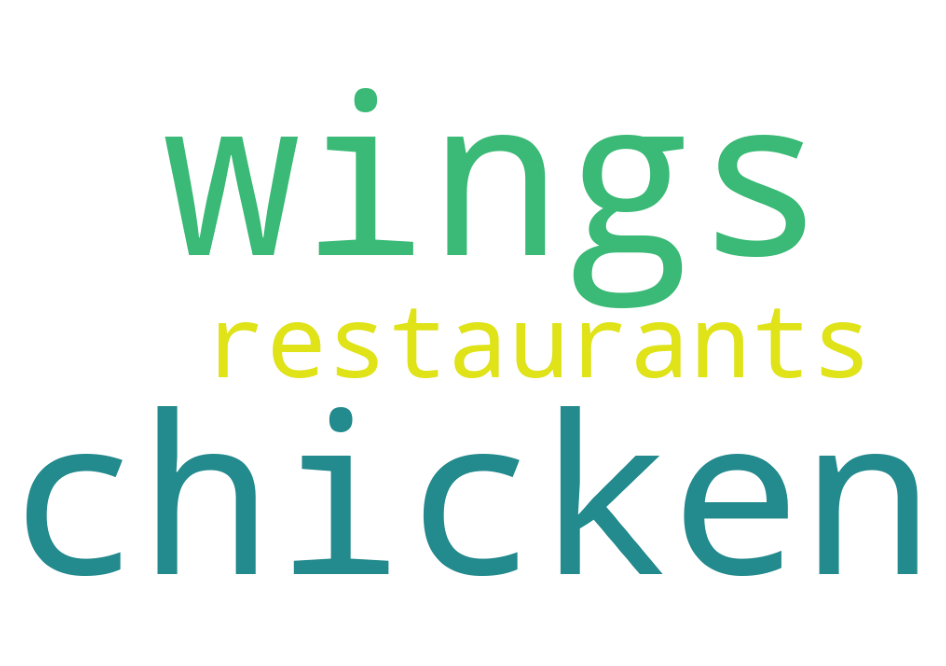

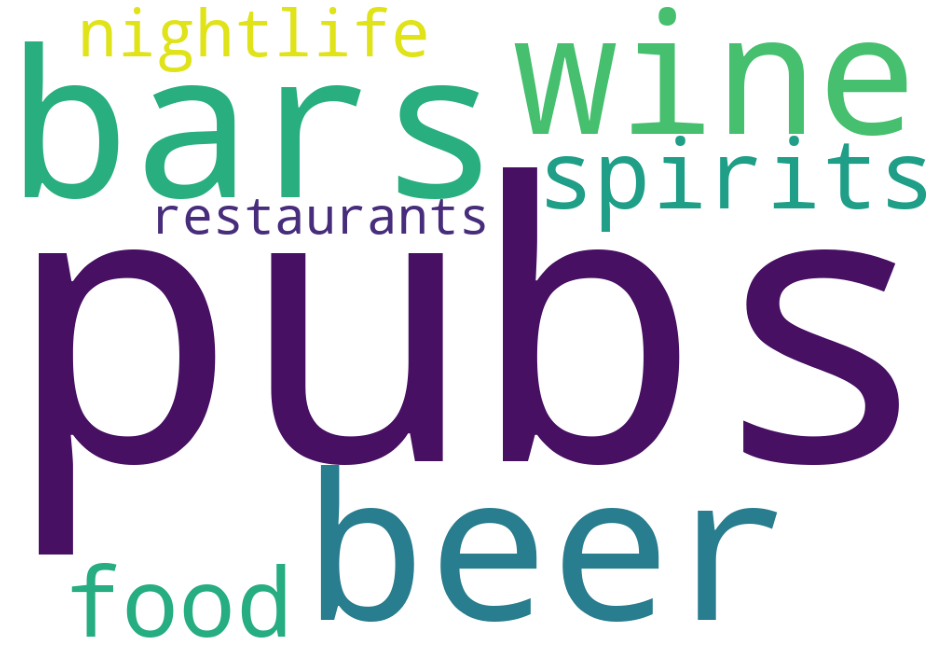

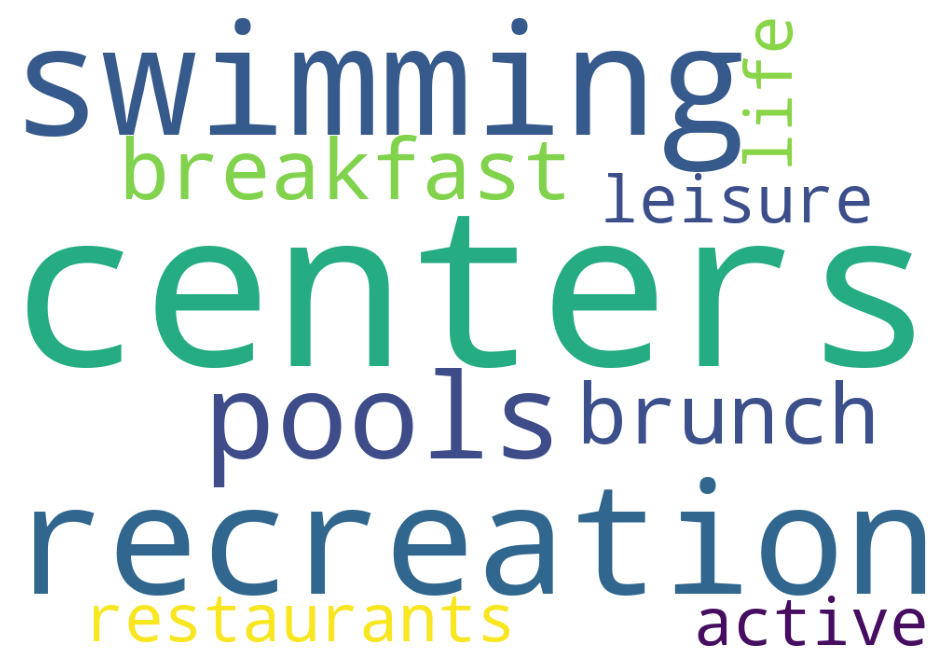

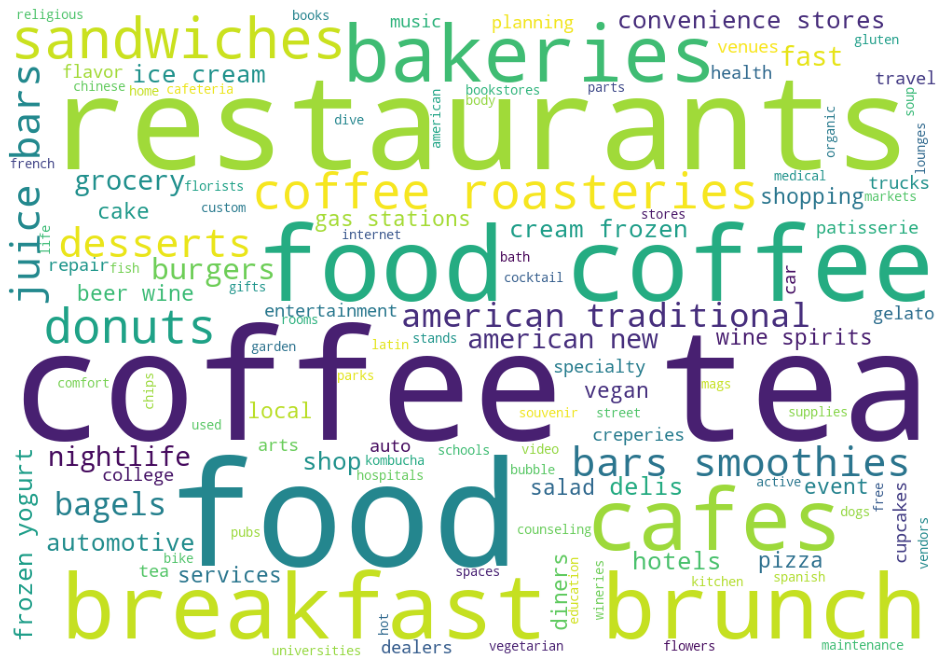

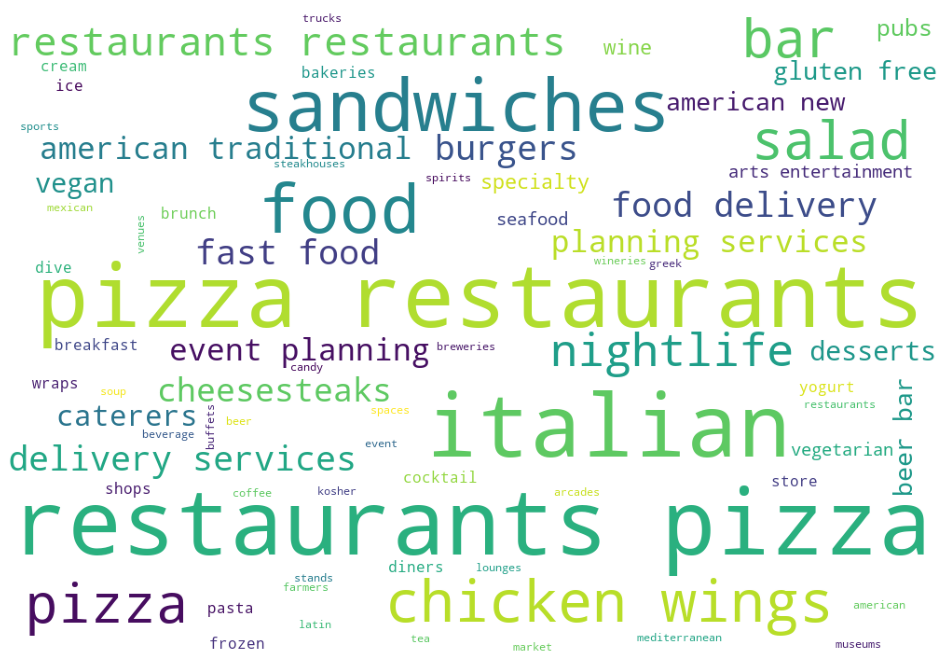

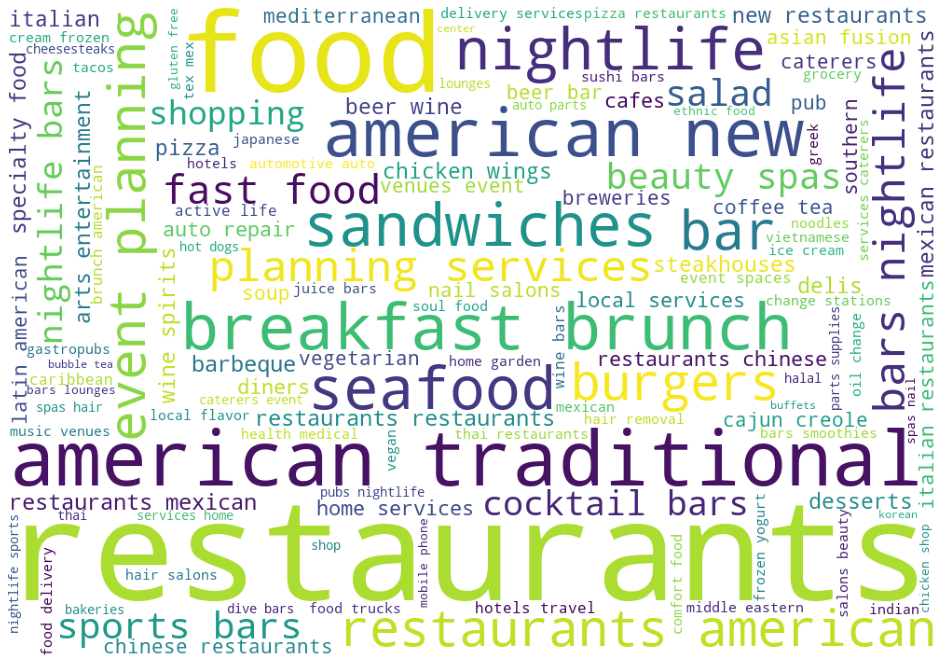

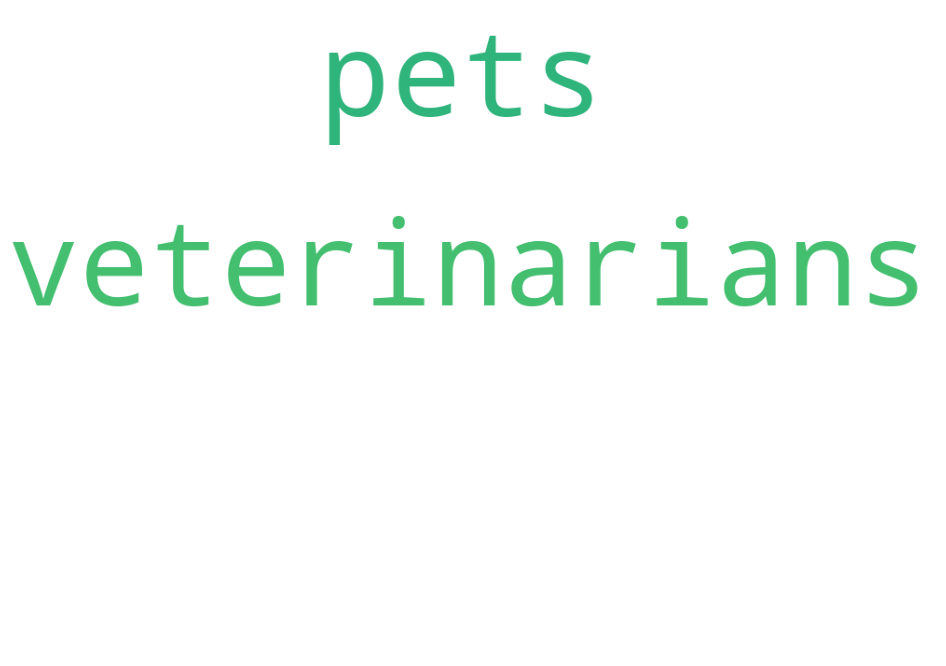

In [126]:
culster_word_cloud(10, categories_tw, corpus_categories)

## tips

In [129]:
counter = Counter(' '.join(corpus_tips).split())
sorted(counter.items(), key=lambda x:-x[1])

[('!', 39605),
 ('.', 28647),
 ('great', 8371),
 ('food', 7315),
 ('good', 5579),
 ('service', 4899),
 ('place', 4660),
 ("n't", 3893),
 ('best', 3526),
 ('get', 2627),
 ('...', 2593),
 ('love', 2427),
 ('$', 2198),
 ('go', 2031),
 (')', 2024),
 ('amazing', 1843),
 ('friendly', 1821),
 (':', 1808),
 ('staff', 1775),
 ('time', 1713),
 ('nice', 1589),
 ('always', 1588),
 ('awesome', 1545),
 ('like', 1507),
 ('delicious', 1486),
 ('pizza', 1369),
 ('(', 1358),
 ('?', 1357),
 ('one', 1316),
 ('chicken', 1308),
 ('try', 1297),
 ('back', 1282),
 ('ever', 1187),
 ('really', 1104),
 ('beer', 1085),
 ('new', 1071),
 ('order', 1040),
 ('come', 1032),
 ("'ve", 1030),
 ('wait', 992),
 ('fresh', 978),
 ('bar', 938),
 ('excellent', 935),
 ('free', 919),
 ('atmosphere', 915),
 ('``', 843),
 ('lunch', 821),
 ('favorite', 803),
 ('would', 803),
 ('menu', 799),
 ('people', 788),
 ('hot', 783),
 ("''", 782),
 ('never', 778),
 ('hour', 775),
 ('day', 767),
 ('breakfast', 767),
 ('sushi', 763),
 ('worth', 

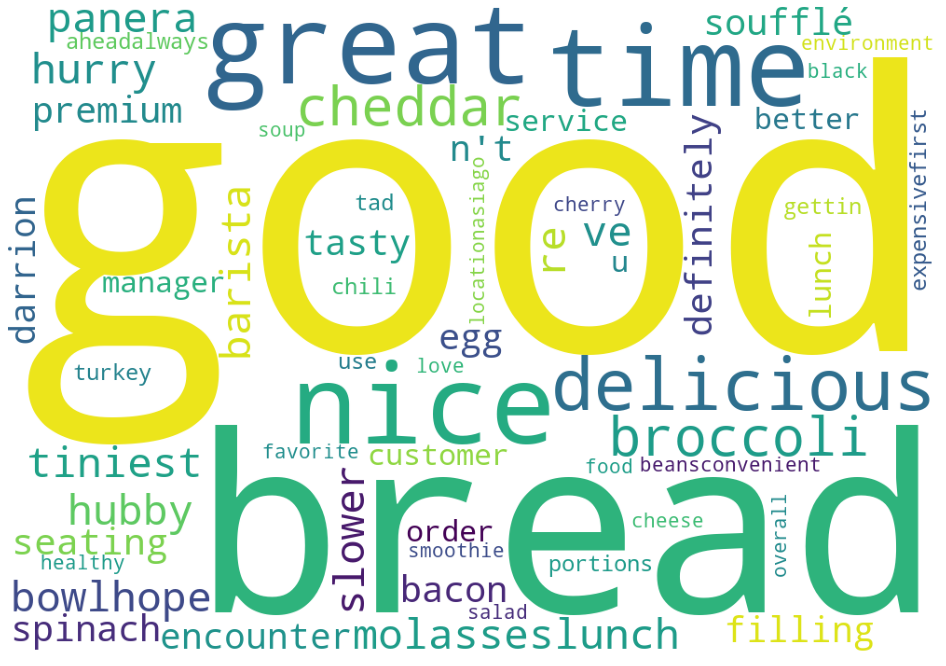

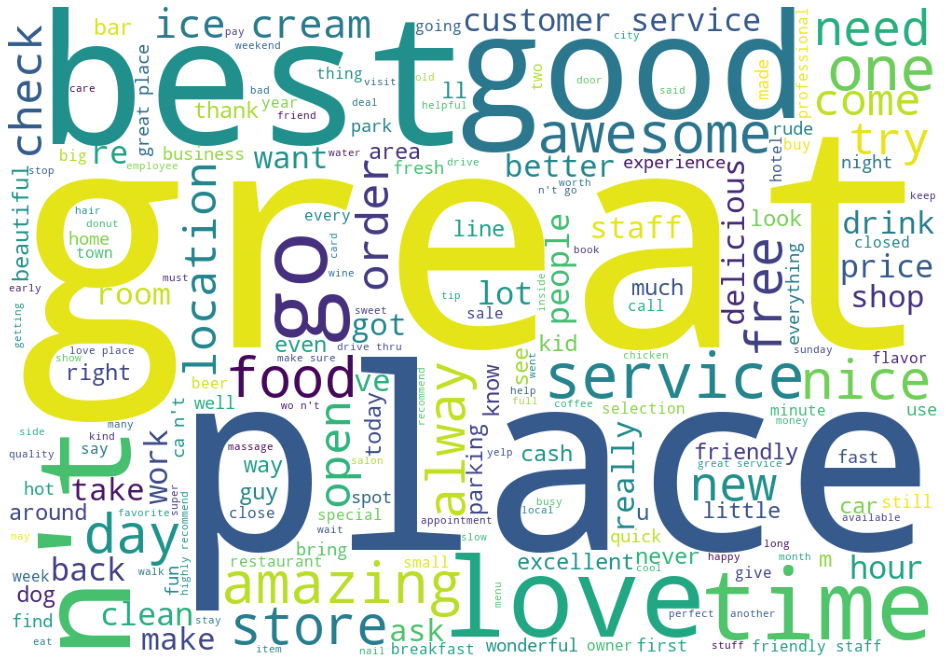

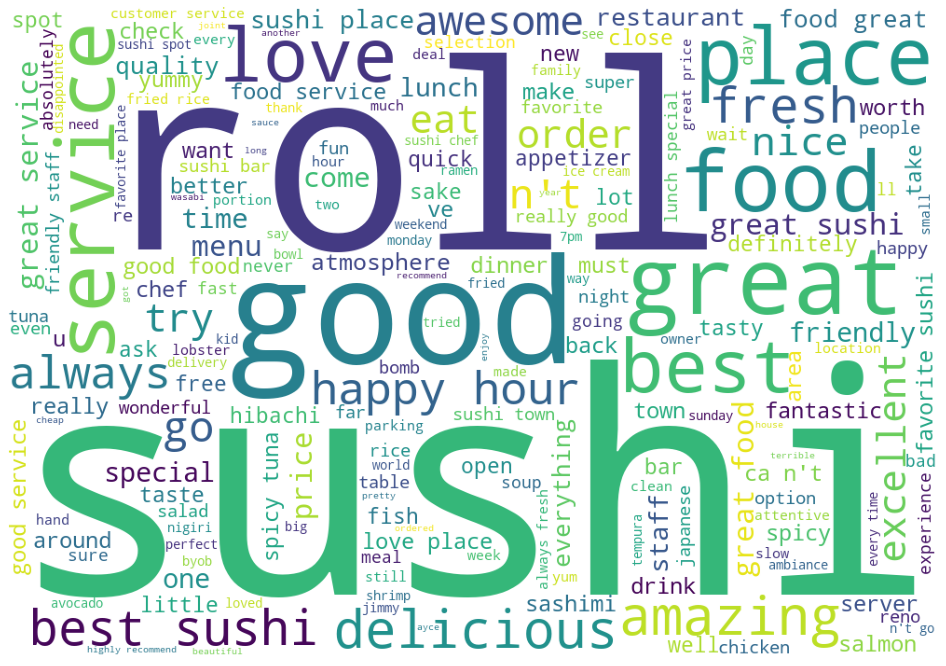

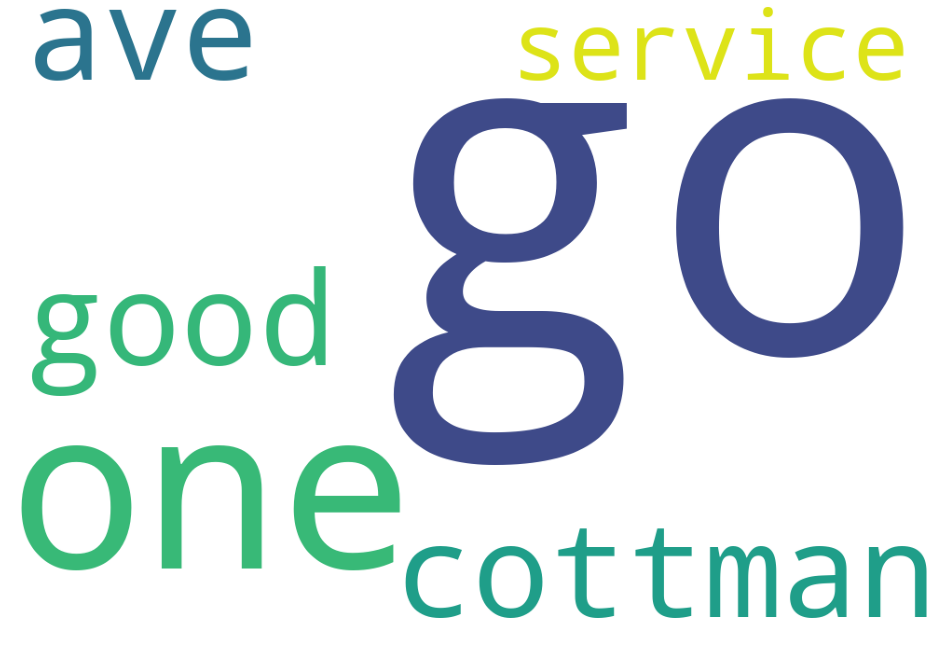

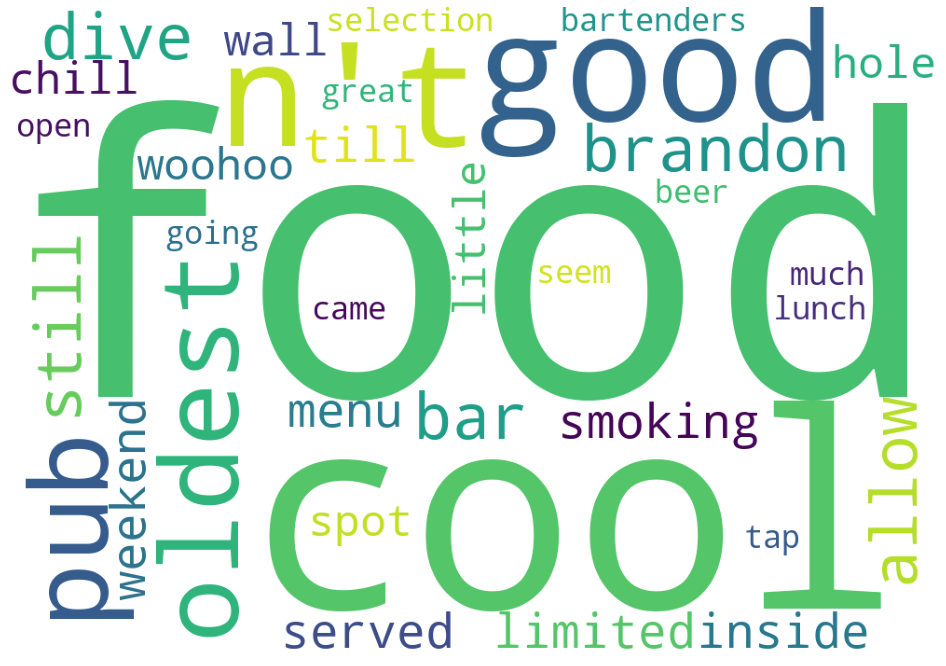

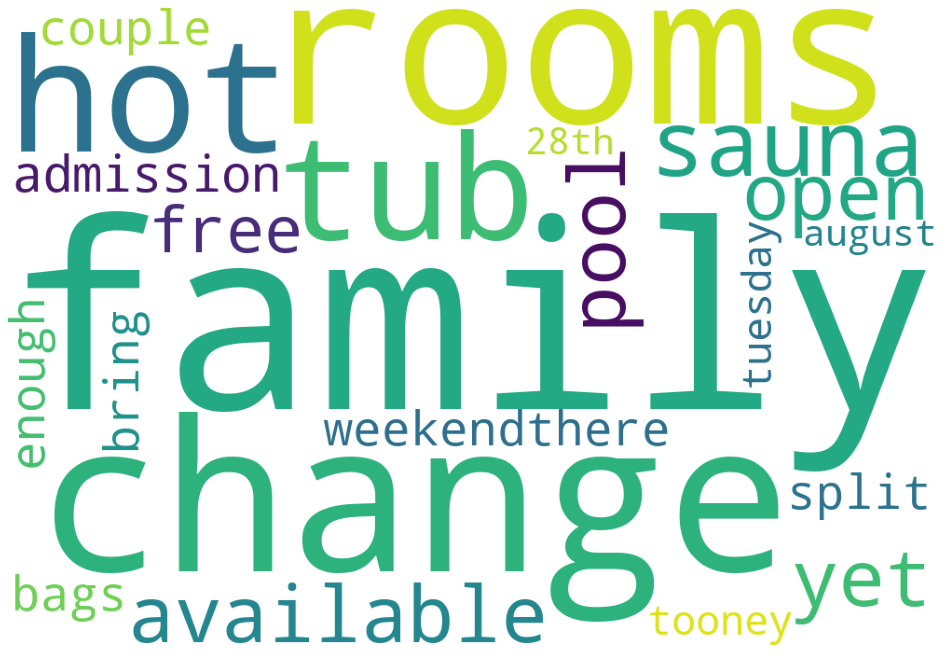

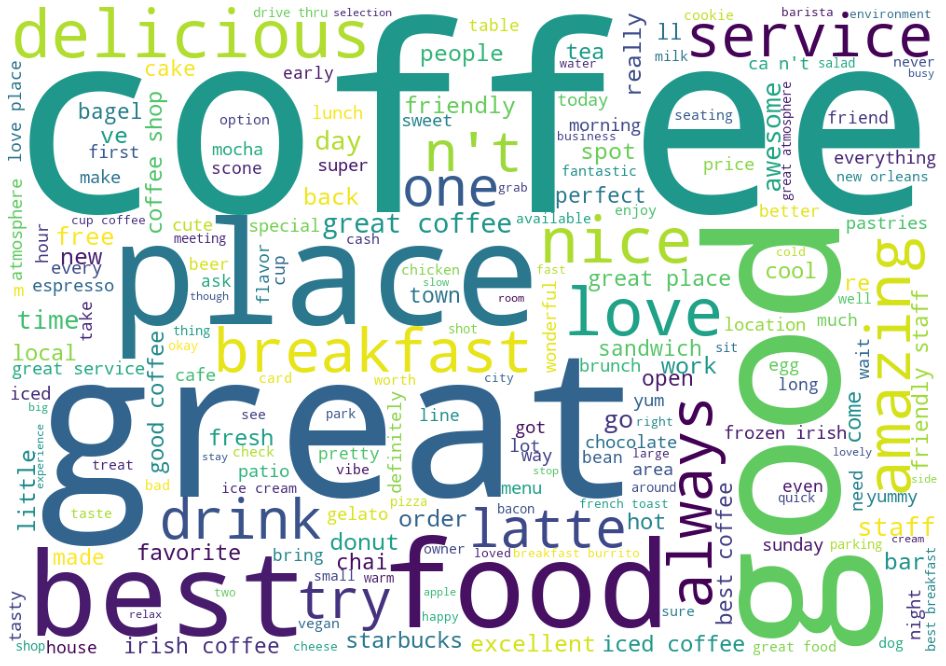

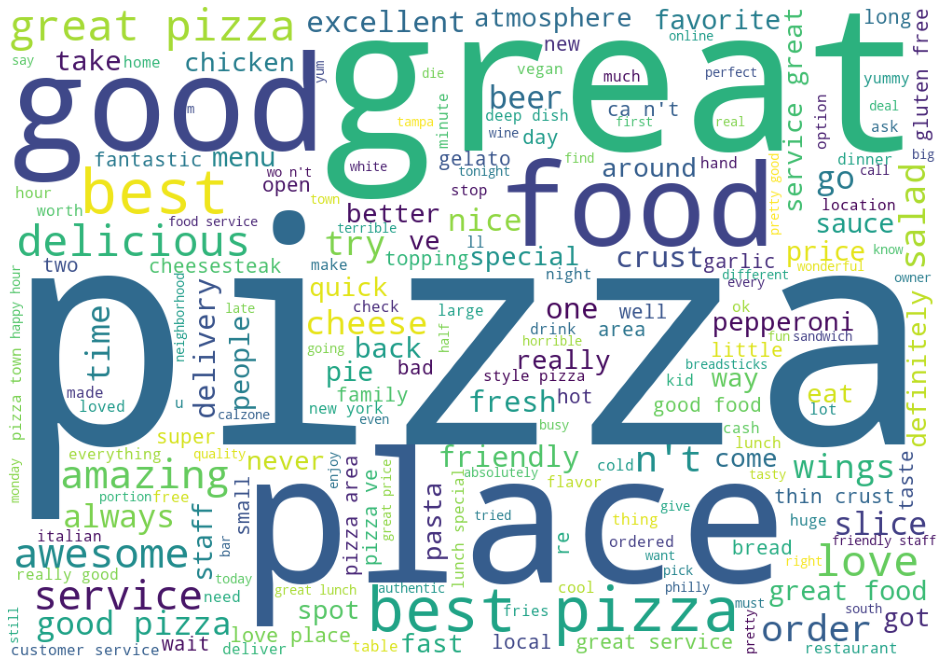

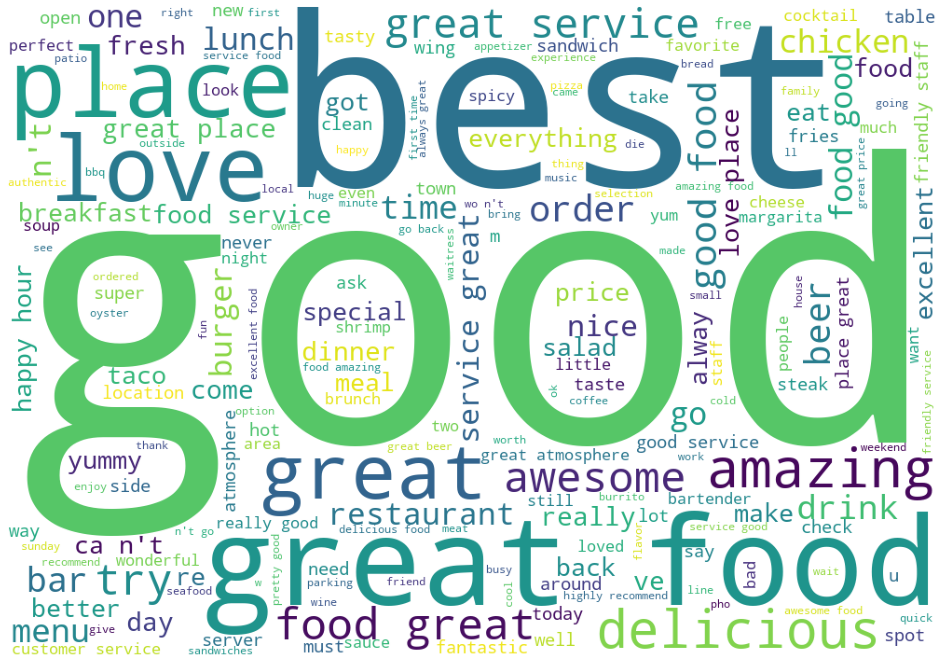

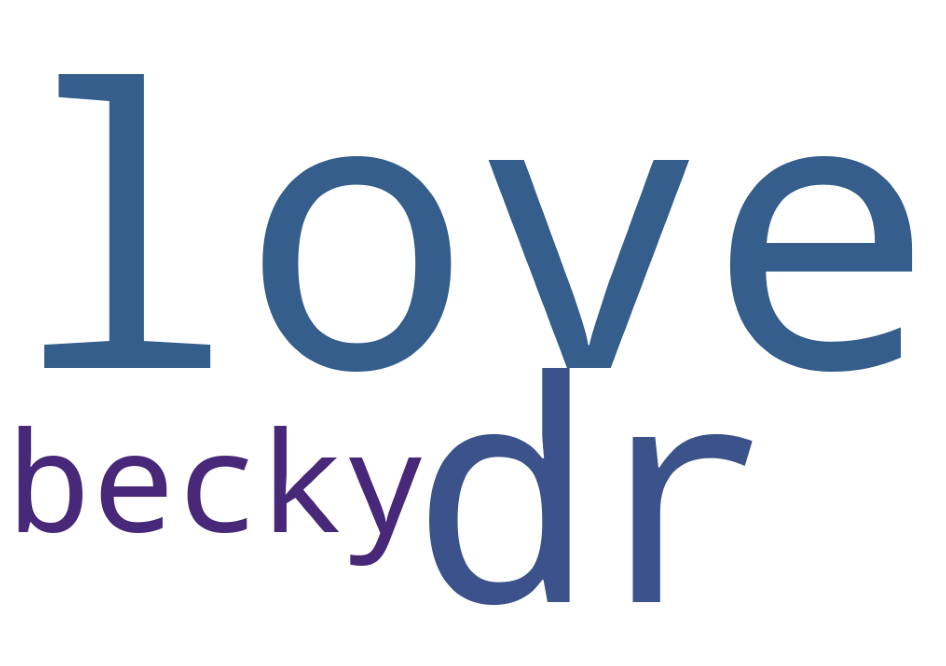

In [131]:
culster_word_cloud(10, tips_tw, corpus_tips)

## reviews

In [133]:
counter = Counter(' '.join(corpus_reviews).split())
sorted(counter.items(), key=lambda x:-x[1])

[('.', 2725077),
 ('!', 642934),
 ("n't", 322007),
 ('food', 226270),
 ('good', 212469),
 ('place', 199659),
 ('great', 196093),
 (')', 176013),
 ('(', 164370),
 ('service', 152304),
 ('time', 150138),
 ('would', 149190),
 ('get', 142666),
 ('like', 141638),
 ('one', 138506),
 ('back', 126564),
 ('go', 115699),
 ('really', 103308),
 ('also', 99712),
 ('got', 94435),
 ('us', 93544),
 ("'ve", 92371),
 ('...', 86372),
 ('could', 84403),
 ('$', 82699),
 ('even', 82587),
 ("''", 81564),
 ('``', 81432),
 ('best', 79575),
 ('nice', 78851),
 ('staff', 78149),
 ('?', 76510),
 ('order', 74838),
 ('ordered', 74535),
 ('well', 73689),
 ("'m", 73002),
 ('always', 71652),
 ('chicken', 69913),
 ('friendly', 68254),
 ('never', 67416),
 ('came', 66487),
 ('love', 65471),
 ('first', 64573),
 ('delicious', 63570),
 ('definitely', 63288),
 ('restaurant', 62372),
 ('went', 61530),
 ('little', 60809),
 ('try', 59860),
 ('people', 59441),
 ('new', 58348),
 ('come', 58207),
 ('experience', 58129),
 ('amazing'

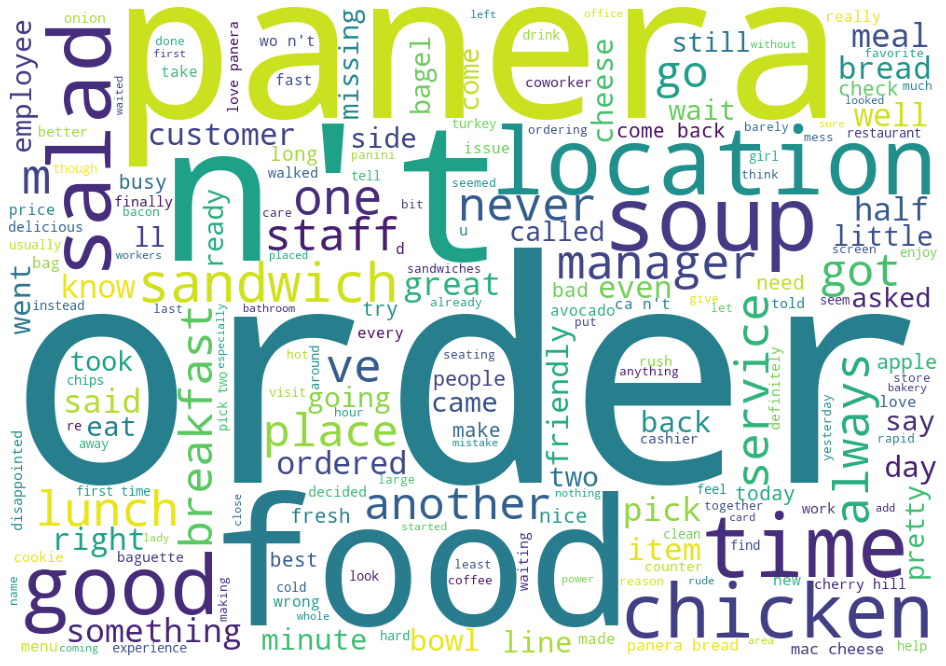

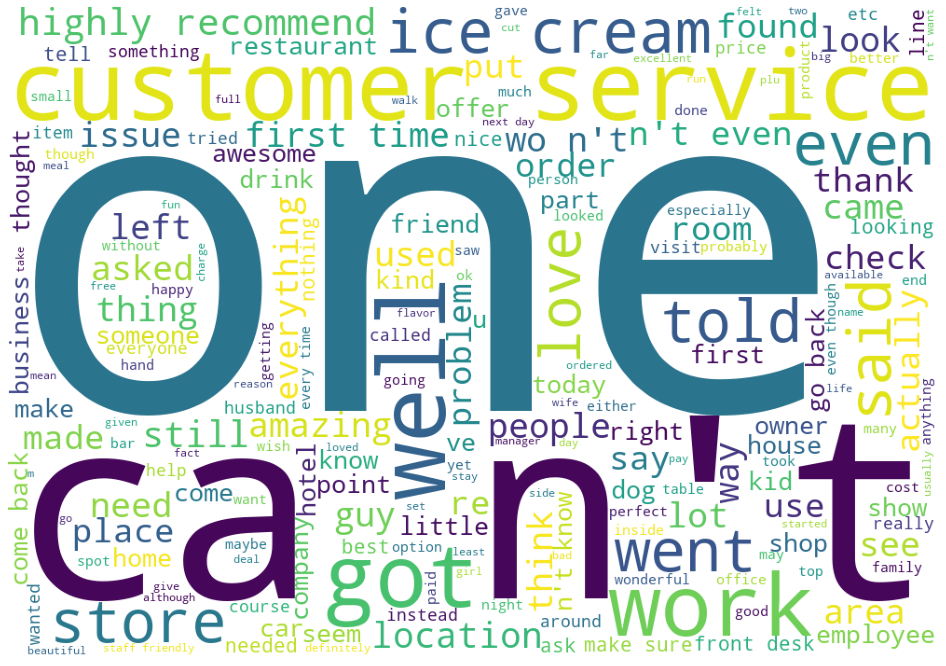

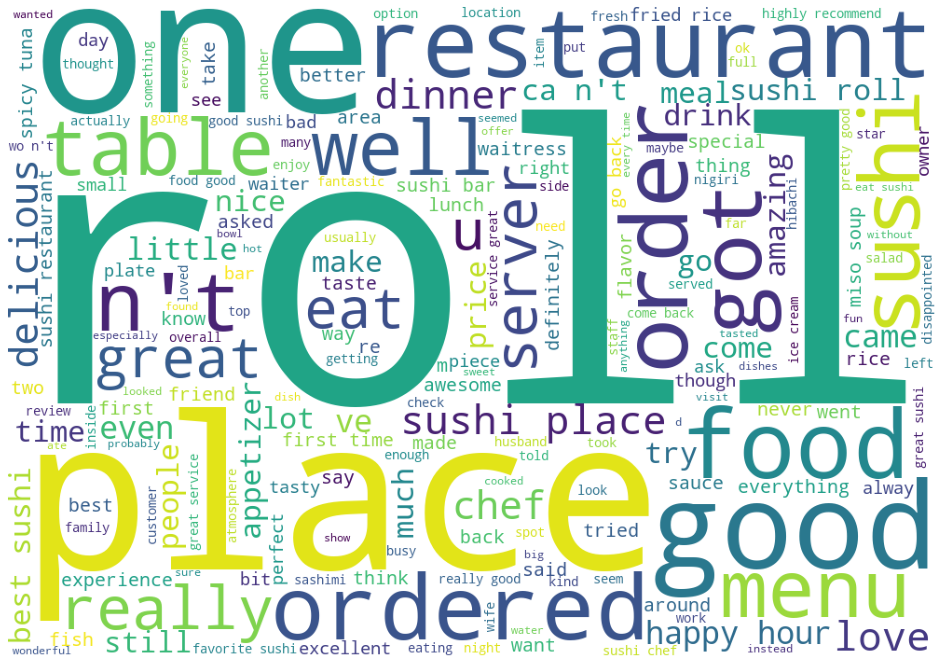

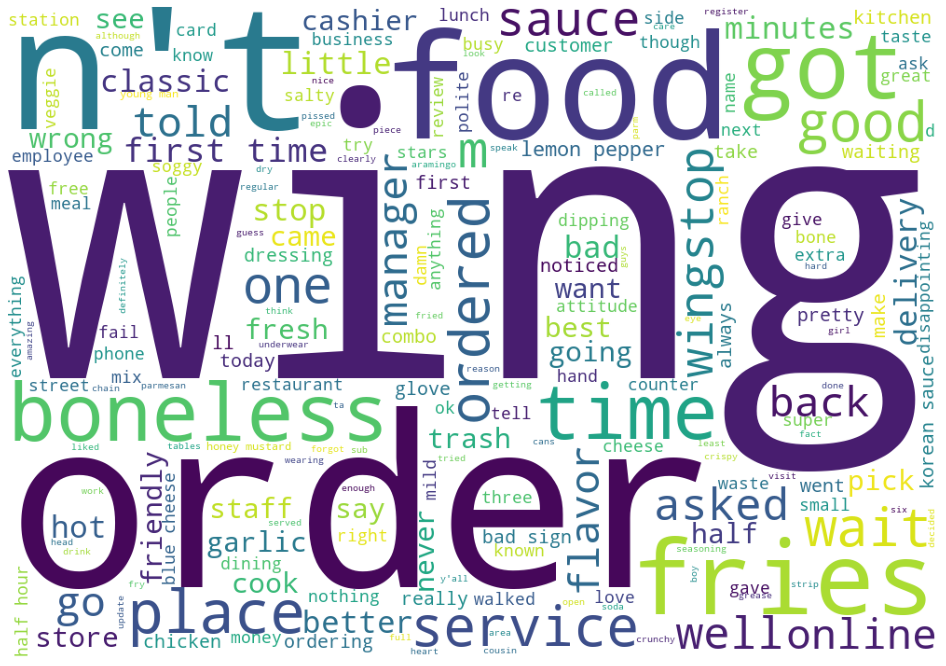

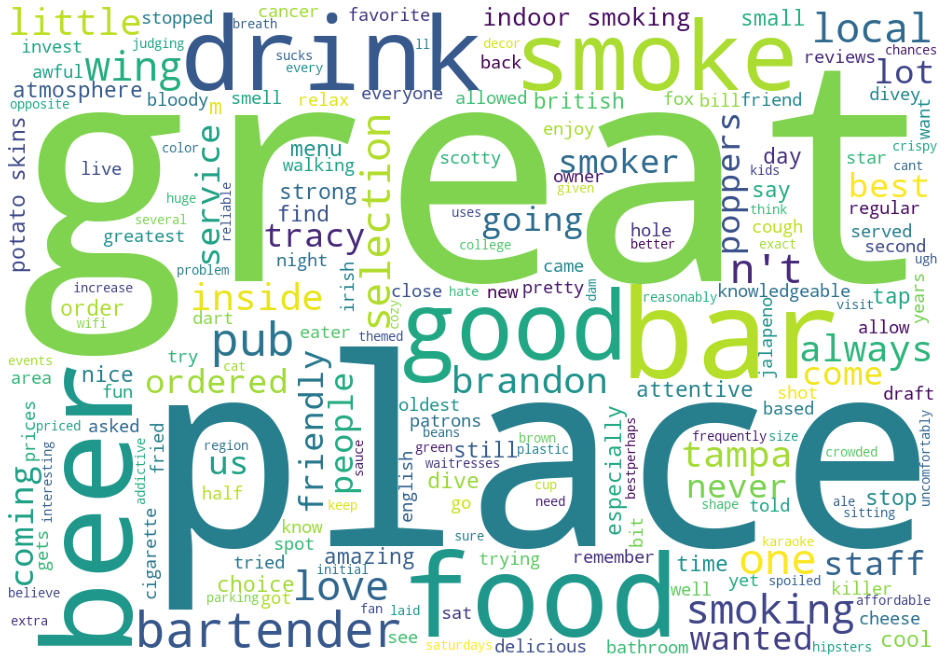

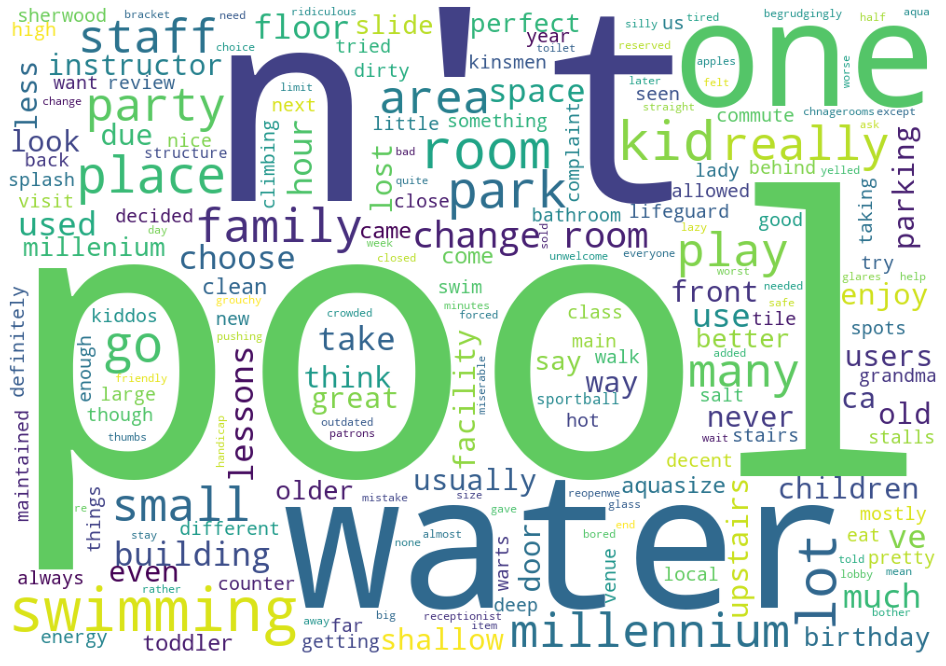

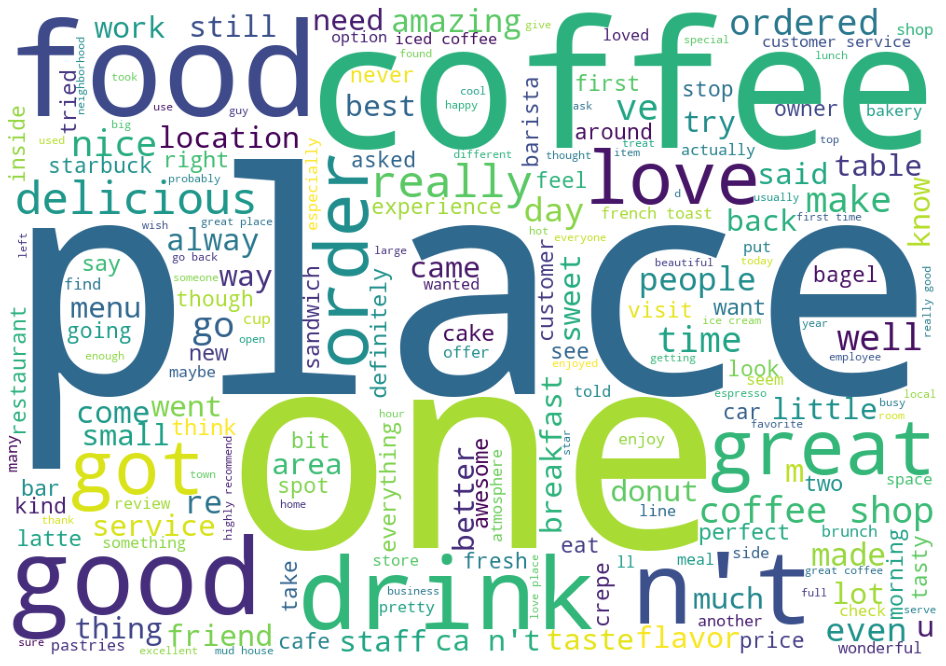

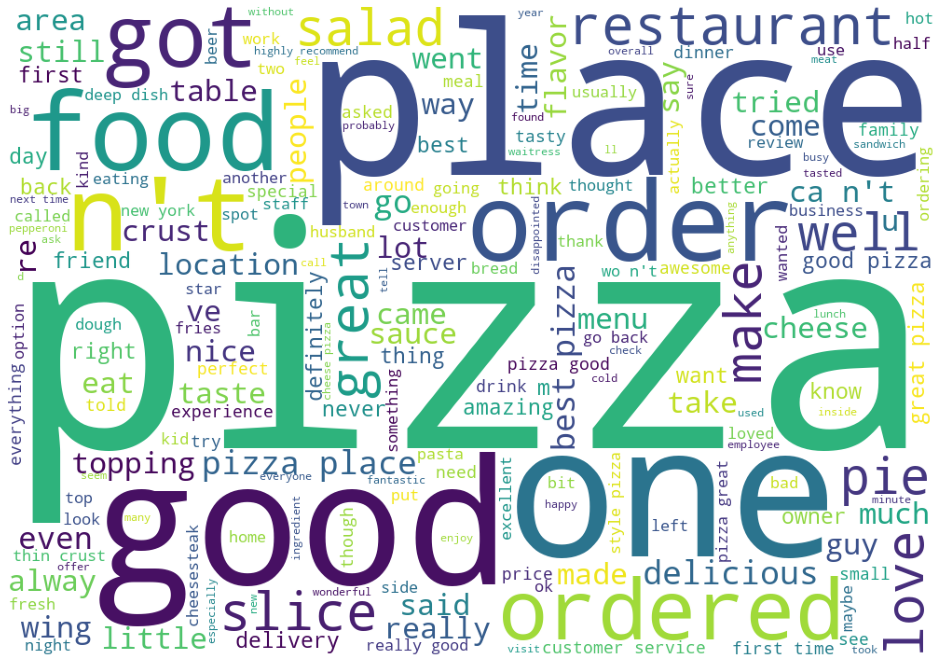

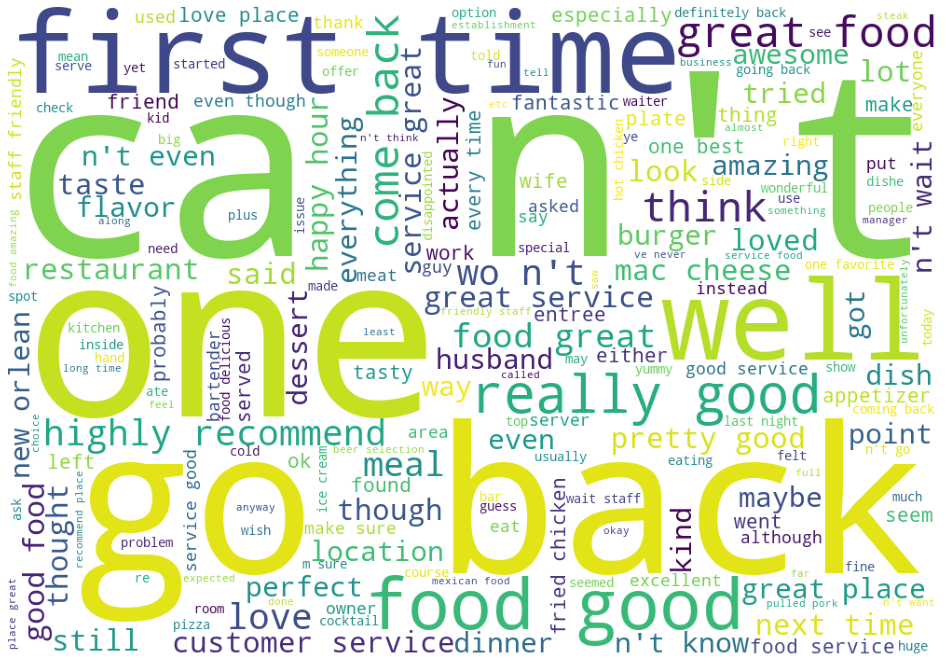

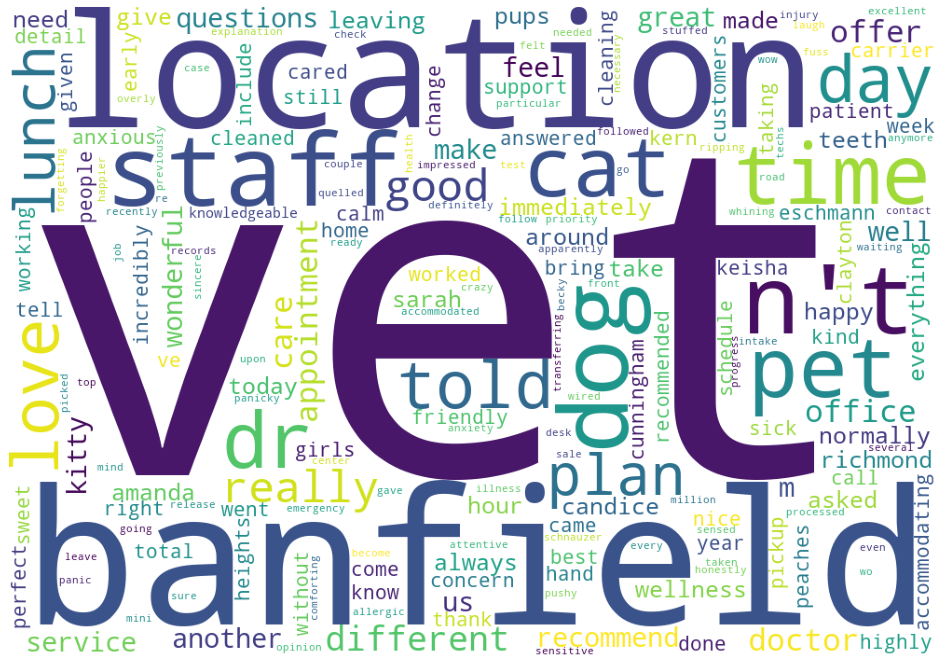

In [132]:
culster_word_cloud(10, reviews_tw, corpus_reviews)